# Stage-1-Visualization

In [28]:
# Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random

%pylab inline
import matplotlib.image as mpimg

import os
import sys
import glob
import warnings

# Reload changed modules every time
%load_ext autoreload
%autoreload 2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


/usr/local/lib/python3.8/dist-packages/IPython/core/magics/pylab.py:162: UserWarning: pylab import has clobbered these variables: ['random']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


In [29]:
sys.path.insert(0, '/mnt/rds/redhen/gallina/home/hxm471/'\
                'RedHenLab-Multimodal_TV_Show_Segmentation/mtvss/')
import constants as const
sys.path.insert(0, '/mnt/rds/redhen/gallina/home/hxm471/'\
                'RedHenLab-Multimodal_TV_Show_Segmentation/mtvss/pipeline_stage1')
from model import Model

In [30]:
# Print out hxm471 home path
const.H_GAL_HOME_PATH

'/mnt/rds/redhen/gallina/home/hxm471/'

In [31]:
file_path = '1996-08-01_0000_US_00017469_V2_VHS52_MB19_E4_MB_image_filtered.csv'

## Load in CSV as DataFrame 

In [32]:
image_filtered_df = pd.read_csv(const.H_GAL_HOME_PATH+'splits/tmp/'+file_path)
image_filtered_df

,Unnamed: 0,label,start,end,confidence
0,0,TitleSequence,2740.00,2745.30,0.972905
1,1,TitleSequence,2790.22,2797.52,0.681087
2,2,Commercial,2830.60,2853.20,0.965426
3,3,Commercial,2855.72,2880.88,0.777645
4,4,TitleSequence,2904.78,2908.36,0.649919
...,...,...,...,...,...
232,232,TitleSequence,16988.68,16994.92,0.993111
233,233,Commercial,16999.36,17016.92,0.989519
234,234,TitleSequence,17100.00,17102.28,0.885580
235,235,Commercial,17142.16,17146.10,0.610967


## Visualizations

<AxesSubplot:>

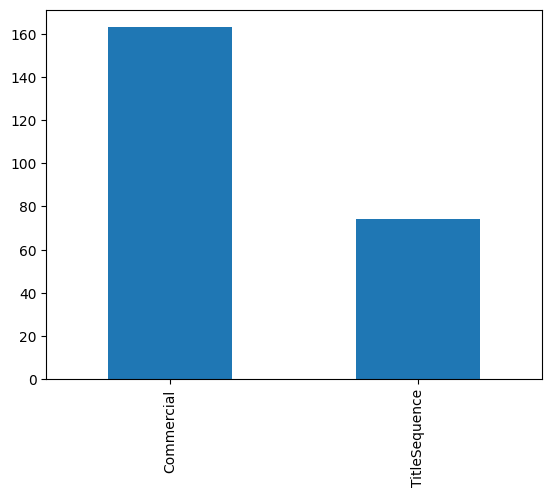

In [33]:
image_filtered_df['label'].value_counts().plot(kind='bar')

In [34]:
(image_filtered_df['confidence']<=0.9).sum()

158

<AxesSubplot:xlabel='start', ylabel='confidence'>

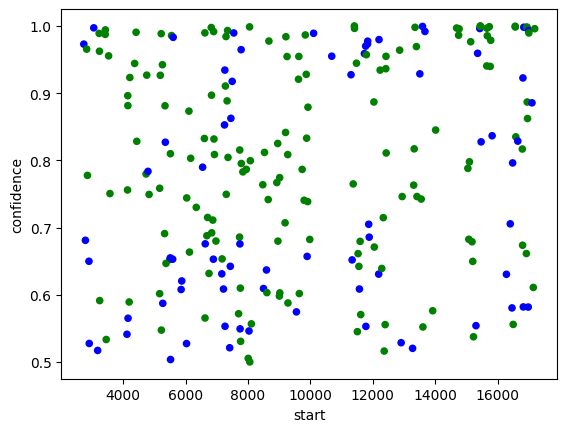

In [35]:
colors = {'Commercial':'green','TitleSequence':'blue'}
image_filtered_df.plot('start','confidence',kind='scatter',
                       c=image_filtered_df['label'].map(colors))

## Clean DataFrame 

In [36]:
image_filtered_clean_df = image_filtered_df['confidence'] > 0.95
image_filtered_clean_df = image_filtered_df.loc[image_filtered_clean_df]
image_filtered_clean_df

,Unnamed: 0,label,start,end,confidence
0,0,TitleSequence,2740.00,2745.30,0.972905
2,2,Commercial,2830.60,2853.20,0.965426
6,6,TitleSequence,3058.84,3062.18,0.997100
8,8,Commercial,3231.28,3233.78,0.988843
9,9,Commercial,3241.20,3243.62,0.962326
...,...,...,...,...,...
227,227,Commercial,16937.00,16938.16,0.998372
228,228,Commercial,16938.74,16942.42,0.997609
232,232,TitleSequence,16988.68,16994.92,0.993111
233,233,Commercial,16999.36,17016.92,0.989519


<AxesSubplot:xlabel='start', ylabel='confidence'>

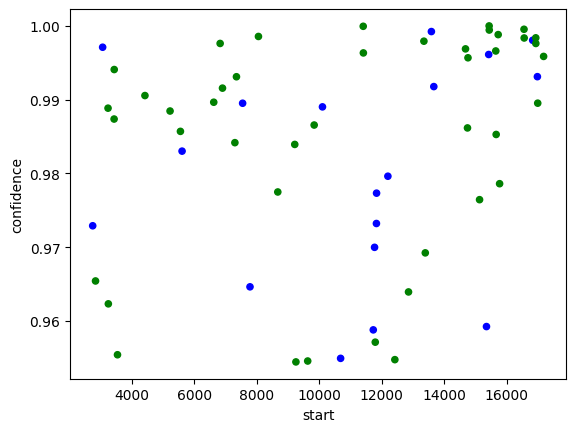

In [37]:
image_filtered_clean_df.plot('start','confidence',kind='scatter',
                       c=image_filtered_clean_df['label'].map(colors))

## Extract Keyframes

In [38]:
from decord import VideoReader
from decord import gpu, cpu
mp4_path = const.ROS_PATH+'1996/'+'1996-01/'+'1996-01-11/'+\
    '1996-01-11_0000_US_00017994_V1_VHS46_MB21_H9_WR.mp4'
def prediction_image_extraction(filename,start_time,stop_time):
    '''Using start and stop times provided, extract 5 keyframe images
    for prediction.

    Args:
        filename (str): Name of file being processed
        start_time (list): list of start times for music intervals.
        stop_time (list): list of stop times for music intervals.
    Returns:
        images (np.ndarray): batches of 5 keyframe images.
    '''

    vr = VideoReader(mp4_path, ctx=cpu(0))
    frame_num = len(vr)

    print(start_time)

    for idx in range(len(start_time.index)):
        timestamp = (start_time.iloc[idx],stop_time.iloc[idx])

    idx=0
    t_list = []
    frames = []
    for i in range(0,frame_num,24):
        # Check if all music timestamps have been mapped
        if idx>=len(start_time.index):
            break
        # Get timestamp range for current frame
        timestamp = vr.get_frame_timestamp(i)
        # Get timestamp of music interval at idx
        mtimestamp = (start_time.iloc[idx],stop_time.iloc[idx])
        # Check if music timestamp is within frame timestamp
        difftime = timestamp-mtimestamp
        # difftime[0] > 0 - start time falls within range 
        # difftime[1] < 0 - end time falls within range
        if(difftime[0]>0 and difftime[1]<0):
            if(idx>len(frames)-1):
                frames.append([i,i])
                t_list.append([timestamp[0],timestamp[0]])
            elif(frames[idx][1]<i):
                frames[idx][1]=i
                t_list[idx][1]=timestamp[0]
        # Start time out of range
        elif(difftime[0]<0):
            continue
        # End time out of range 
        else:
            idx+=1
            continue

    print('\n-- Keyframe Extraction --')
    print("## Length of vid:",frame_num)
    print("## Timestamps list:",t_list)
    print("## Frame mapping:",frames)
    print("## Frame mapping len:",len(frames))


    images_batch = []
    images=[]
    idx=0
    for i in frames:
        images_batch.append([])
        for j in range(5):
            if(i[0]>=i[1]):
                continue
            rand = round(random.randint(i[0],i[1]),2)
            images_batch[idx].append(rand)
        idx+=1

    # To flatten a list of lists
    images_batch_flat = [x for xs in images_batch for x in xs]
    images = vr.get_batch(images_batch_flat).asnumpy()

    return images

In [39]:
img_array = []
start_times = image_filtered_clean_df['start']
stop_times = image_filtered_clean_df['end']
img_array = prediction_image_extraction(file_path,start_times,stop_times)

len(img_array)

0       2740.00
2       2830.60
6       3058.84
8       3231.28
9       3241.20
         ...   
227    16937.00
228    16938.74
232    16988.68
233    16999.36
236    17187.94
Name: start, Length: 61, dtype: float64

-- Keyframe Extraction --
## Length of vid: 875815
## Timestamps list: [[2740.3403, 2745.1453], [2830.8308, 2852.4524], [3059.059, 3061.4614], [3232.032, 3233.6335], [3241.6416, 3243.2432], [3425.826, 3427.4275], [3430.6306, 3432.2322], [3534.7346, 3535.5356], [4414.815, 4426.8267], [5218.819, 5222.022], [5551.952, 5551.952], [5604.004, 5606.4062], [6619.4194, 6620.22], [6823.6235, 6824.4243], [6898.899, 6905.305], [7296.897, 7302.5024], [7346.5464, 7347.347], [7544.344, 7553.954], [7780.5806, 7782.182], [8051.2515, 8057.6577], [8671.071, 8671.872], [9214.814, 9218.018], [9251.651, 9272.473], [9629.63, 9631.231], [9837.037, 9840.24], [10102.903, 10105.306], [10684.284, 10685.886], [11408.208, 11409.81], [11413.013, 11416.216], [11730.931, 11732.532], [11771.771, 11776.576]

285

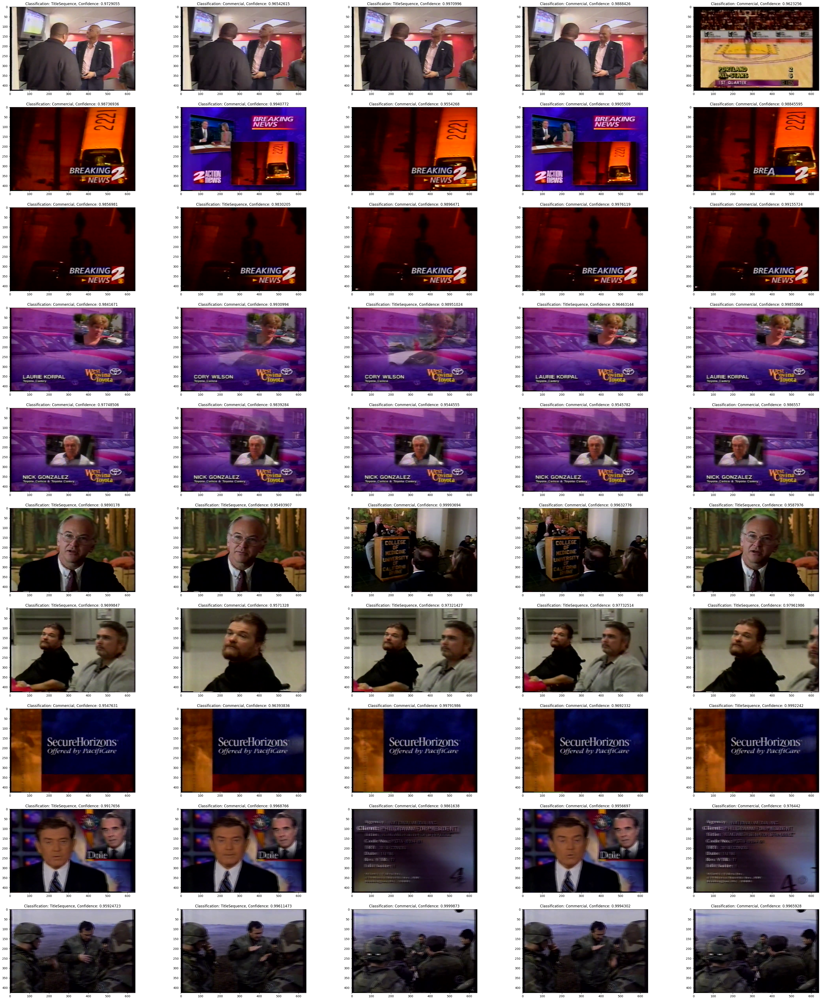

TypeError: savefig() missing 1 required positional argument: 'fname'

<Figure size 640x480 with 0 Axes>

In [41]:
fig, axs = plt.subplots(nrows=10, ncols=5, figsize=(50,60))

for j, ax in enumerate(axs.flatten()):
    plt.sca(ax)
    plt.imshow(img_array[j])
    plt.title('Classification: {}, Confidence: {}'.format(image_filtered_clean_df['label'].iloc[j],
                                                     image_filtered_clean_df['confidence'].iloc[j]))

plt.show()
plt.savefig()

35
36
37
38
39


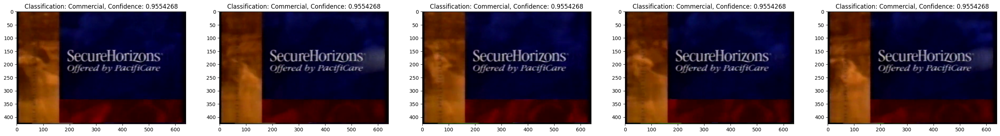

TypeError: savefig() missing 1 required positional argument: 'fname'

<Figure size 640x480 with 0 Axes>

In [54]:
fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(35,30))
j = 35
for _, ax in enumerate(axs.flatten()):
    print(j)
    plt.sca(ax)
    plt.imshow(img_array[j])
    plt.title('Classification: {}, Confidence: {}'.format(image_filtered_clean_df['label'].iloc[j//5],
                                                     image_filtered_clean_df['confidence'].iloc[j//5]))
    j+=1

plt.show()
plt.savefig()